In [8]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision.utils import save_image

import my_gan

# Hyperparameter configuration

In [9]:
n_epochs = 200
batch_size = 64
learning_rate = 0.0001
latent_dim = 100
save_interval = 500

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [10]:
os.makedirs('result_imgs', exist_ok=True)

# Load Data

In [11]:
# Load data
dataloader = DataLoader(
    datasets.MNIST('./data/mnist', train=True, download=True,
                   transform=transforms.Compose([
                       transforms.ToTensor(),
                       transforms.Normalize((0.5,), (0.5,))
                   ])),
    batch_size=batch_size, shuffle=True)


# Initialize Models and Optimizer

In [12]:
# Initialize models and optimizers
generator = my_gan.Generator().to(device)
discriminator = my_gan.Discriminator().to(device)
optimizer_G = torch.optim.Adam(generator.parameters(), lr=learning_rate)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=learning_rate)


# Train the GAN

In [13]:
# Start training
my_gan.train(dataloader, discriminator, generator, optimizer_G, optimizer_D, n_epochs, save_interval, latent_dim)


[Epoch 1/200] [Batch 0/938] D Loss: 0.6721855401992798 G Loss: 0.7053605318069458
[Epoch 1/200] [Batch 1/938] D Loss: 0.6385475397109985 G Loss: 0.6834914684295654
[Epoch 1/200] [Batch 2/938] D Loss: 0.6095229387283325 G Loss: 0.6596814393997192
[Epoch 1/200] [Batch 3/938] D Loss: 0.5839188098907471 G Loss: 0.6398140788078308
[Epoch 1/200] [Batch 4/938] D Loss: 0.5663394331932068 G Loss: 0.6180424094200134
[Epoch 1/200] [Batch 5/938] D Loss: 0.5538332462310791 G Loss: 0.5968435406684875
[Epoch 1/200] [Batch 6/938] D Loss: 0.543630063533783 G Loss: 0.5733375549316406
[Epoch 1/200] [Batch 7/938] D Loss: 0.5380672812461853 G Loss: 0.5523579120635986
[Epoch 1/200] [Batch 8/938] D Loss: 0.5411620736122131 G Loss: 0.5311740636825562
[Epoch 1/200] [Batch 9/938] D Loss: 0.5366348028182983 G Loss: 0.5105431079864502
[Epoch 1/200] [Batch 10/938] D Loss: 0.5427493453025818 G Loss: 0.491860568523407
[Epoch 1/200] [Batch 11/938] D Loss: 0.5468519926071167 G Loss: 0.4745323956012726
[Epoch 1/200] [B

In [14]:
def sample_images(generator, epoch, batches_done, phase, latent_dim):
    z = torch.randn(25, latent_dim).to(device)
    gen_imgs = generator(z)
    save_image(gen_imgs, f'result_imgs/{phase}_epoch{epoch}_batch{batches_done}.png', nrow=5, normalize=True, value_range=(-1, 1))

# Task 2: Sample 25 images from trained GAN

In [15]:
# Sample 25 images from the trained GAN
my_gan.sample_images(generator, n_epochs, 0, 'final', latent_dim)


In [16]:
def interpolate_images(generator, z1, z2, steps=7):
    generator.eval() 

    alpha_vals = np.linspace(0, 1, steps + 2)
    z_interpolated = torch.stack([(1 - alpha) * z1 + alpha * z2 for alpha in alpha_vals]).to(device)
    
    z_interpolated = z_interpolated.view(steps + 2, latent_dim)
    
    print("z_interpolated shape:", z_interpolated.shape)

    with torch.no_grad():
        gen_imgs = generator(z_interpolated)

    print("gen_imgs shape:", gen_imgs.shape) 

    save_image(gen_imgs, 'result_imgs/interpolation3.png', nrow=9, normalize=True, value_range=(-1, 1))
    generator.train()

# Task 3: Interpolating between two images

In [17]:
# Sample 2 latent vectors
z1 = torch.randn(1, latent_dim).to(device)
z2 = torch.randn(1, latent_dim).to(device) * 2

interpolate_images(generator, z1, z2)


z_interpolated shape: torch.Size([9, 100])
gen_imgs shape: torch.Size([9, 1, 28, 28])


# Result

## Task 2 Result

At the start of training


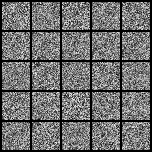

Half way through training


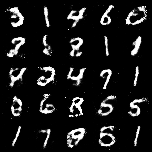

At the end of training


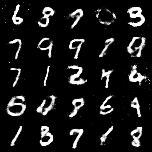

In [2]:
from IPython.display import display, Image

print("At the start of training")
display(Image("./result_imgs/start_epoch0_batch0.png"))

print("Half way through training")
display(Image("./result_imgs/midway_epoch100_batch0.png"))

print("At the end of training")
display(Image("./result_imgs/end_epoch199_batch0.png"))


## Task 3 Result

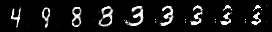

In [4]:
display(Image("./result_imgs/interpolation3.png"))